In [37]:
import os
import shutil
import cv2
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

import torch
print("Torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())


Torch version: 2.6.0+cu124
CUDA available: True


In [38]:
!pip install ultralytics

In [39]:
from ultralytics import YOLO

In [40]:
dataset_path = "/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset"

for root, dirs, files in os.walk(dataset_path):
    level = root.replace(dataset_path, '').count(os.sep)
    indent = ' ' * 2 * level
    print(f"{indent}{os.path.basename(root)}/")
    


    train/


### preprocessing step


In [41]:
img_dir = "/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/train"
label_dir = "/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/labels/train"

image_files = sorted([f[:-4] for f in os.listdir(img_dir) if f.endswith('.jpg') or f.endswith('.png')])
label_files = sorted([f[:-4] for f in os.listdir(label_dir) if f.endswith('.txt')])

print(f"Images: {len(image_files)}, Labels: {len(label_files)}")

missing_labels = set(image_files) - set(label_files)
print(f"Missing labels for: {missing_labels}")


Images: 738, Labels: 738
Missing labels for: set()


In [ ]:
yaml_content = """
path: /kaggle/input/traffic-vehicles-object-detection
train: /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/train
val: /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/val

nc: 7
names: ['Voiture','Plaque d’immatriculation','Plaque d’immatriculation floutée','Deux-roues','Auto-rickshaw','Bus','Camion']
"""

with open("data.yaml", "w") as f:
    f.write(yaml_content)

!cat data.yaml



path: /kaggle/input/traffic-vehicles-object-detection
train: /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/train
val: /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/val

nc: 7
names: ['Voiture','Plaque d’immatriculation','Plaque d’immatriculation floutée','Deux-roues','Auto-rickshaw','Bus','Camion']


In [8]:
from ultralytics import YOLO

model = YOLO('runs/train/vehicle_yolov8/weights/best.pt')
results=model.train(
    data='data.yaml',
    epochs=20,
    imgsz=640,
    project='runs/train',
    name='vehicle_yolov8',
    exist_ok=True
)

Ultralytics 8.3.237 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=runs/train/vehicle_yolov8/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=vehicle_yolov8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0

In [9]:
!ls runs/train/
!ls runs/train/*/weights/


vehicle_yolov8
best.pt  last.pt


In [44]:
from ultralytics import YOLO

model = YOLO('runs/train/vehicle_yolov8/weights/best.pt')

val_results=model.predict(
    source='/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/val',
    save=True,
    save_txt=True,
    conf=0.25,
    project='runs/predict',
    name='val_results',
    exist_ok=True
)



image 1/185 /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/val/00 (106).jpg: 640x384 3 Voitures, 1 Bus, 3 Camions, 26.0ms
image 2/185 /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/val/00 (107).jpg: 640x384 3 Voitures, 1 Plaque d’immatriculation floutée, 1 Bus, 1 Camion, 25.1ms
image 3/185 /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/val/00 (108).jpg: 640x384 3 Voitures, 2 Plaque d’immatriculations, 1 Deux-roues, 1 Bus, 1 Camion, 25.2ms
image 4/185 /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/val/00 (109).jpg: 640x384 4 Voitures, 1 Deux-roues, 1 Bus, 1 Camion, 21.8ms
image 5/185 /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/val/00 (110).jpg: 640x384 3 Voitures, 1 Plaque d’immatriculation floutée, 1 Deux-roues, 1 Bus, 2 Camions, 21.9ms
image 6/185 /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/val/00 (111).jpg: 640x384 3 Voitures, 1 Plaque

In [45]:
metrics = model.val()

Ultralytics 8.3.237 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 200.0±145.8 MB/s, size: 104.6 KB)
val: Scanning /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/labels/val... 185 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 185/185 876.4it/s 0.2s0.0s
WARNING ⚠️ val: Cache directory /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 2.2it/s 5.5s0.3s
                   all        185       1980      0.801      0.765      0.831       0.59
               Voiture        159       1061      0.884      0.925       0.95      0.805
Plaque d’immatriculation        104        174      0.746       0.86      0.868      0.557
Plaque d’immatriculation floutée         80        161      0.835      0.547      0.732      0.396
            Deux-roues

In [46]:
precision = metrics.box.mp
recall = metrics.box.mr
map50 = metrics.box.map50
map5095 = metrics.box.map

f1 = 2 * (precision * recall) / (precision + recall + 1e-6)

print(f"Precision:      {precision:.3f}")
print(f"Recall:         {recall:.3f}")
print(f"F1 Score:       {f1:.3f}")
print(f"mAP@0.5:        {map50:.3f}")
print(f"mAP@0.5:0.95:   {map5095:.3f}")


Precision:      0.801
Recall:         0.765
F1 Score:       0.783
mAP@0.5:        0.831
mAP@0.5:0.95:   0.590


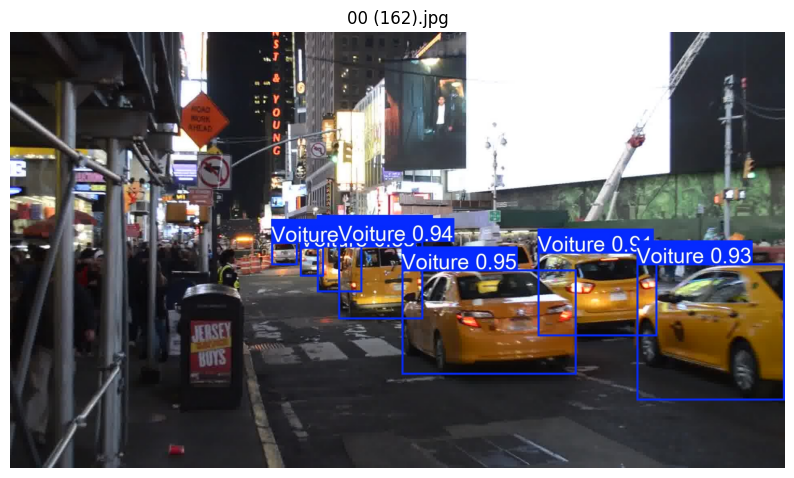

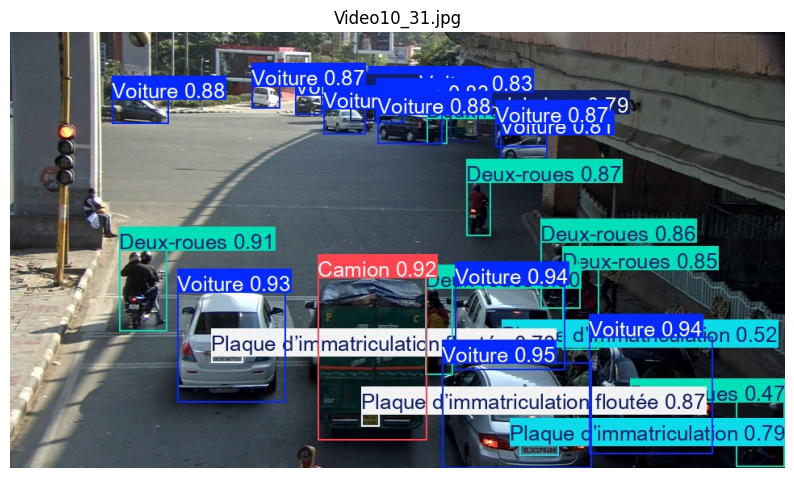

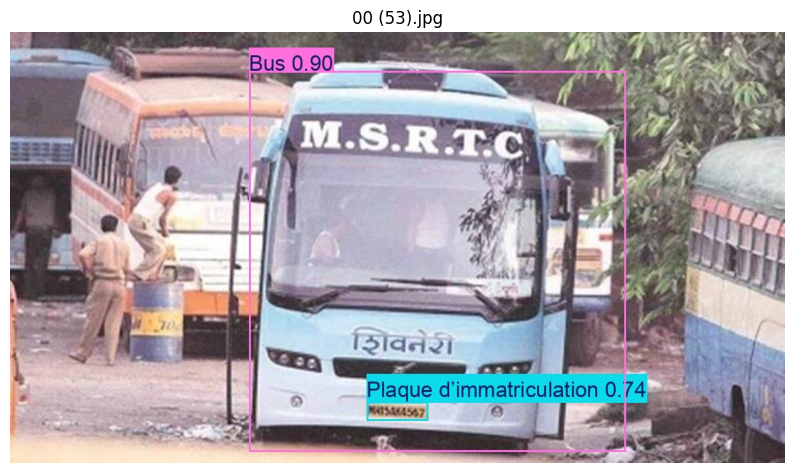

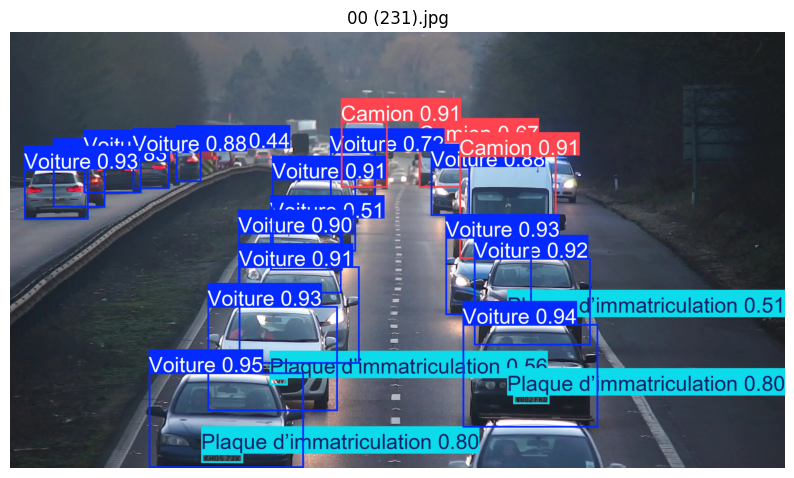

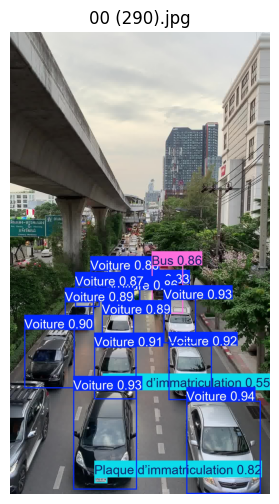

In [47]:
folder_path = 'runs/predict/val_results'
sample_files = os.listdir(folder_path)[:5]

for file in sample_files:
    if file.endswith('.jpg') or file.endswith('.png'):
        img_path = os.path.join(folder_path, file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 6))
        plt.imshow(img)
        plt.title(file)
        plt.axis('off')
        plt.show()

In [34]:
import cv2
from pathlib import Path

test_folder = Path("/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/test")
image_exts = ['.jpg', '.jpeg', '.png']
video_exts = ['.mp4', '.avi', '.mov', '.mkv']

image_count = 0
txt_expected = 0
frame_skip = 10

for file_path in test_folder.iterdir():
    if file_path.suffix.lower() in image_exts:
        image_count += 1
        txt_expected += 1  # one per image
    elif file_path.suffix.lower() in video_exts:
        cap = cv2.VideoCapture(str(file_path))
        frame_total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        cap.release()
        frame_processed = frame_total // frame_skip
        txt_expected += frame_processed

print(f"Images found: {image_count}")
print(f"Estimated .txt label files (with frame skipping): {txt_expected}")


Images found: 260
Estimated .txt label files (with frame skipping): 894


In [ ]:

from ultralytics import YOLO
import cv2
from pathlib import Path
import shutil


test_folder = Path("/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/test")
save_dir = Path("runs/predict/test_results")
label_dir = save_dir / "labels"
image_out_dir = save_dir / "images"
video_out_dir = save_dir / "videos"

shutil.rmtree(save_dir, ignore_errors=True)
label_dir.mkdir(parents=True, exist_ok=True)
image_out_dir.mkdir(parents=True, exist_ok=True)
video_out_dir.mkdir(parents=True, exist_ok=True)

image_exts = ['.jpg', '.jpeg', '.png']
video_exts = ['.mp4', '.avi', '.mov', '.mkv']
frame_skip = 3 
image_count = 0
video_frame_count = 0
txt_expected = 0

for file_path in test_folder.iterdir():
    if file_path.suffix.lower() in image_exts:
        image_count += 1
        txt_expected += 1

        results = model.predict(
            source=str(file_path),
            conf=0.25,
            imgsz=640,
            save=False
        )

        # Save annotated image
        out_img = results[0].plot()
        image_out_path = image_out_dir / file_path.name
        cv2.imwrite(str(image_out_path), out_img)

        # Save label file
        label_path = label_dir / f"{file_path.stem}.txt"
        with open(label_path, "w") as f:
            for box in results[0].boxes:
                cls = int(box.cls[0])
                conf = float(box.conf[0])
                x, y, w, h = box.xywh[0]
                f.write(f"{cls} {x} {y} {w} {h} {conf:.4f}\n")

        del results

    elif file_path.suffix.lower() in video_exts:
        cap = cv2.VideoCapture(str(file_path))
        fps = cap.get(cv2.CAP_PROP_FPS)
        if not fps or fps == 0:
            fps = 24  # fallback FPS
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

        out_video_path = video_out_dir / f"{file_path.stem}_detected.mp4"
        out_video = None  # Lazy init

        frame_num = 0
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            frame_num += 1
            if frame_num % frame_skip != 0:
                continue

            video_frame_count += 1
            txt_expected += 1

            # Resize for model
            resized = cv2.resize(frame, (640, 640))
            results = model.predict(
                source=resized,
                conf=0.25,
                imgsz=640,
                save=False
            )

            plotted = results[0].plot()
            plotted_resized = cv2.resize(plotted, (width, height))

            if out_video is None:
                out_video = cv2.VideoWriter(
                    str(out_video_path),
                    cv2.VideoWriter_fourcc(*'mp4v'),
                    fps,
                    (width, height)
                )

            out_video.write(plotted_resized)

            if len(results[0].boxes) > 0:
                label_path = label_dir / f"{file_path.stem}_frame{frame_num}.txt"
                with open(label_path, "w") as f:
                    for box in results[0].boxes:
                        cls = int(box.cls[0])
                        conf = float(box.conf[0])
                        x, y, w, h = box.xywh[0]
                        f.write(f"{cls} {x} {y} {w} {h} {conf:.4f}\n")

            del results

        cap.release()
        if out_video:
            out_video.release()

txt_actual = len(list(label_dir.glob("*.txt")))

print("✅ Object Detection Completed")
print(f"Images processed: {image_count}")
print(f" Video frames processed: {video_frame_count} (every {frame_skip}th frame)")
print(f" Expected .txt files: {txt_expected}")
print(f" Actual .txt files saved: {txt_actual}")

if txt_expected == txt_actual:
    print("✅ All labels saved correctly.")
else:
    print("⚠️ Label count mismatch. Check missing or extra files.")



image 1/1 /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/test/00 (10).png: 640x640 2 Voitures, 1 Plaque d’immatriculation, 2 Deux-rouess, 38.2ms
Speed: 4.5ms preprocess, 38.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/predict/val_results
362 labels saved to /kaggle/working/runs/predict/val_results/labels

image 1/1 /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/test/00 (7).png: 608x640 4 Voitures, 1 Plaque d’immatriculation, 1 Deux-roues, 37.3ms
Speed: 2.7ms preprocess, 37.3ms inference, 1.4ms postprocess per image at shape (1, 3, 608, 640)
Results saved to /kaggle/working/runs/predict/val_results
362 labels saved to /kaggle/working/runs/predict/val_results/labels

image 1/1 /kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/test/00 (308).jpg: 640x384 13 Voitures, 3 Plaque d’immatriculations, 2 Deux-rouess, 1 Bus, 26.1ms
Speed: 3.2ms preprocess, 26.1ms infe

In [48]:
import pandas as pd

results_path = "/kaggle/working/runs/train/vehicle_yolov8/results.csv"
df = pd.read_csv(results_path)
print(df.head())
df.describe()

   epoch      time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1   27.0375         0.63102         0.35275         0.86952   
1      2   53.1688         0.67002         0.39757         0.88796   
2      3   79.2051         0.69744         0.41553         0.89552   
3      4  105.2050         0.70667         0.43077         0.90054   
4      5  131.5810         0.70086         0.42145         0.89694   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.80914            0.75639           0.82334   
1               0.78907            0.73228           0.80009   
2               0.77184            0.72913           0.79932   
3               0.81144            0.74373           0.77990   
4               0.80312            0.73723           0.79560   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.58114       0.85000       0.69973       0.97698  0.000296   
1              0.54325       0.89024  

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
count,20.00000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,10.50000,279.358470,0.674777,0.386087,0.883257,0.796513,0.743414,0.807762,0.557734,0.869039,0.697902,0.996966,0.000436,0.000436,0.000436
std,5.91608,158.175347,0.028748,0.035889,0.014313,0.028273,0.019619,0.014629,0.019000,0.022122,0.030236,0.010814,0.000231,0.000231,0.000231
min,1.00000,27.037500,0.622520,0.326410,0.859320,0.734710,0.712280,0.779900,0.533390,0.837650,0.648950,0.976980,0.000054,0.000054,0.000054
25%,5.75000,151.508500,0.651683,0.353560,0.869035,0.776887,0.731492,0.796800,0.542987,0.848150,0.671245,0.988125,0.000268,0.000268,0.000268
50%,10.50000,279.205500,0.681740,0.391720,0.884955,0.806130,0.740385,0.806615,0.549975,0.876725,0.701360,0.998630,0.000437,0.000437,0.000437
75%,15.25000,406.447250,0.698490,0.417010,0.897257,0.813468,0.756463,0.820235,0.576310,0.887857,0.718535,1.004923,0.000605,0.000605,0.000605
max,20.00000,533.798000,0.707450,0.439650,0.900650,0.848510,0.781580,0.832440,0.590140,0.907280,0.749790,1.015070,0.000813,0.000813,0.000813


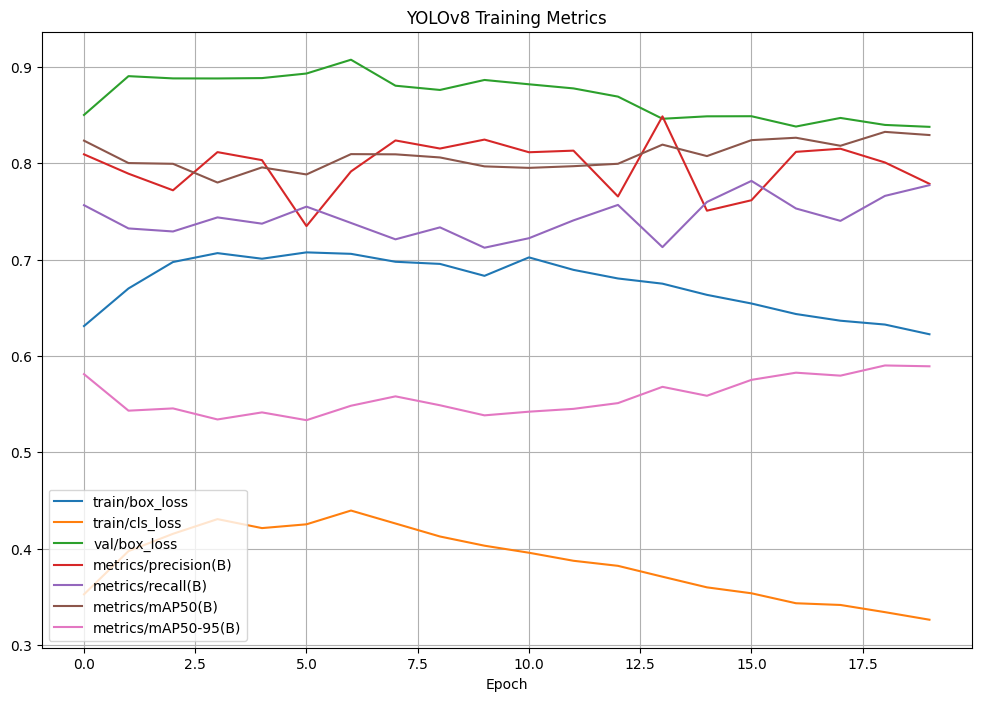

In [49]:
import matplotlib.pyplot as plt

metrics = [
    "train/box_loss",
    "train/cls_loss",
    "val/box_loss",
    "metrics/precision(B)",
    "metrics/recall(B)",
    "metrics/mAP50(B)",
    "metrics/mAP50-95(B)"
]

plt.figure(figsize=(12, 8))
for m in metrics:
    if m in df.columns:
        plt.plot(df[m], label=m)

plt.legend()
plt.title("YOLOv8 Training Metrics")
plt.xlabel("Epoch")
plt.grid()
plt.show()


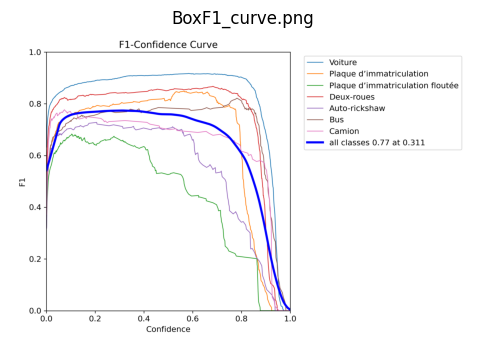

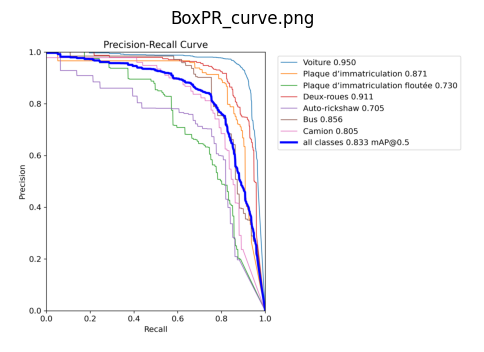

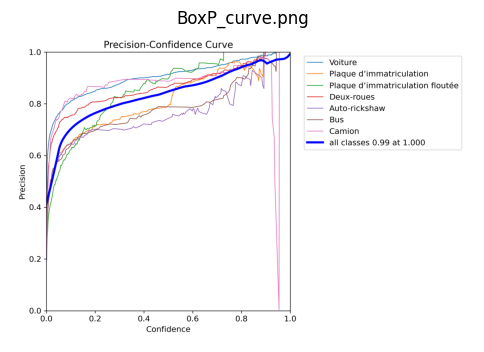

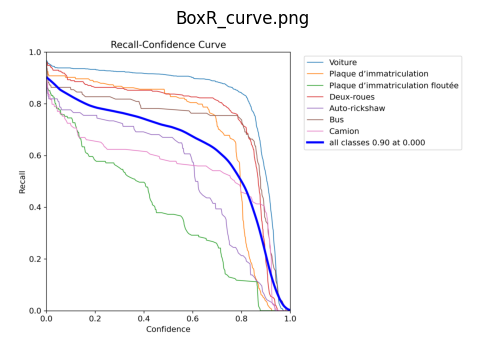

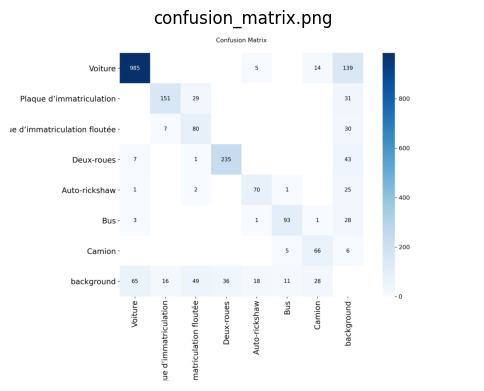

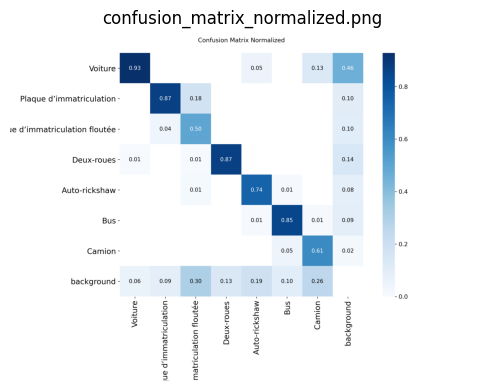

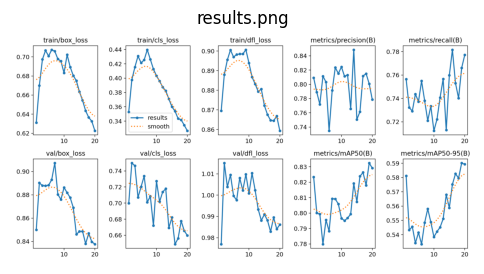

In [52]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

run_dir = Path("/kaggle/working/runs/train/vehicle_yolov8")

images = sorted(run_dir.glob("*.png"))

for img_path in images:
    img = Image.open(img_path)
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(img_path.name)
    plt.show()


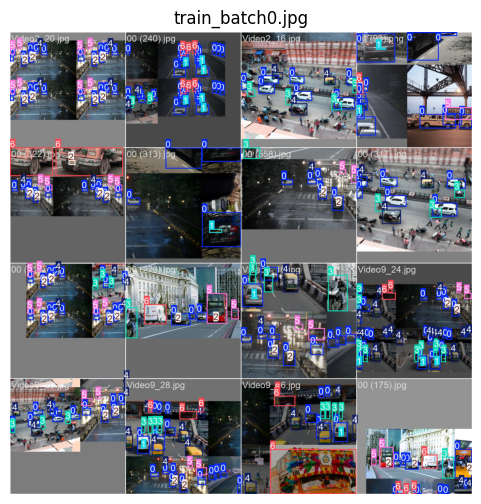

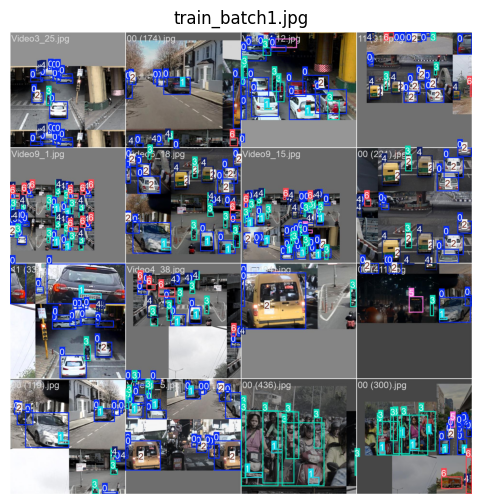

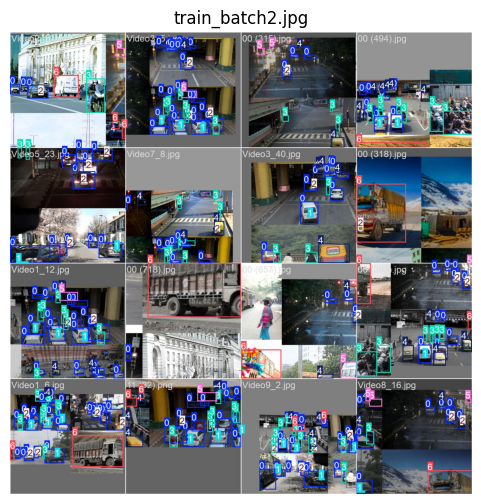

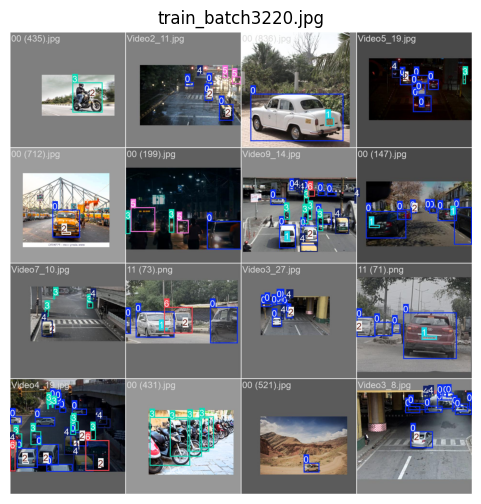

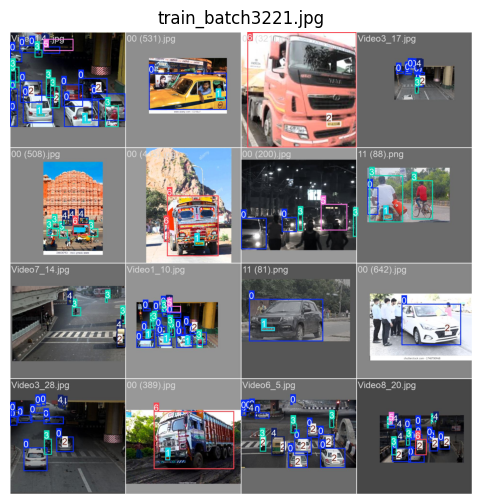

...

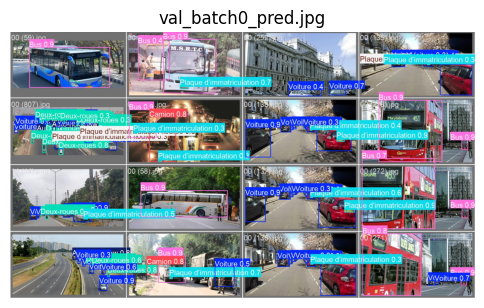

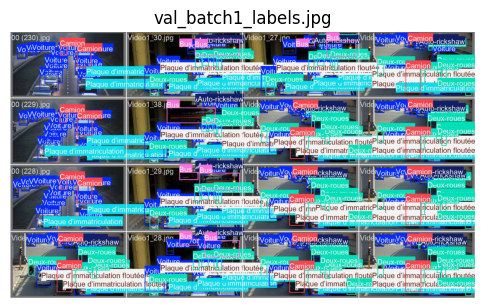

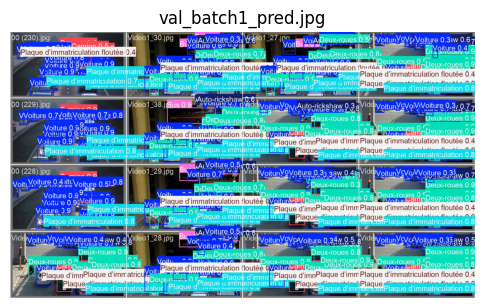

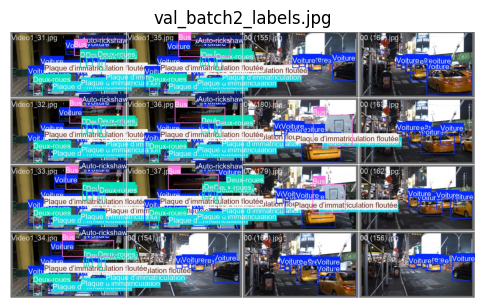

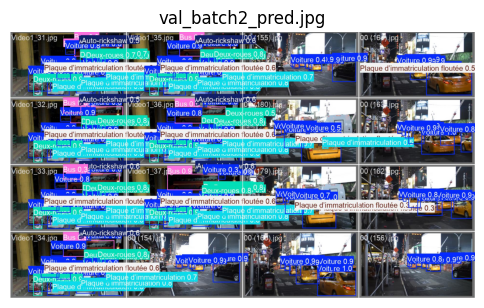

In [53]:
batch_imgs = sorted(run_dir.glob("*batch*.jpg"))

for img_path in batch_imgs:
    img = Image.open(img_path)
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(img_path.name)
    plt.show()


In [54]:
last_epoch = df.iloc[-1]

summary = {
    "Precision": last_epoch.get("metrics/precision(B)"),
    "Recall": last_epoch.get("metrics/recall(B)"),
    "mAP@50": last_epoch.get("metrics/mAP50(B)"),
    "mAP@50-95": last_epoch.get("metrics/mAP50-95(B)")
}

summary


{'Precision': 0.77857,
 'Recall': 0.77718,
 'mAP@50': 0.82916,
 'mAP@50-95': 0.58929}

In [55]:
!zip -r yolov8_training_results.zip /kaggle/working/runs/train/vehicle_yolov8

  adding: kaggle/working/runs/train/vehicle_yolov8/ (stored 0%)
  adding: kaggle/working/runs/train/vehicle_yolov8/train_batch920.jpg (deflated 11%)
  adding: kaggle/working/runs/train/vehicle_yolov8/val_batch0_labels.jpg (deflated 6%)
  adding: kaggle/working/runs/train/vehicle_yolov8/weights/ (stored 0%)
  adding: kaggle/working/runs/train/vehicle_yolov8/weights/last.pt (deflated 8%)
  adding: kaggle/working/runs/train/vehicle_yolov8/weights/best.pt (deflated 8%)
  adding: kaggle/working/runs/train/vehicle_yolov8/BoxP_curve.png (deflated 7%)
  adding: kaggle/working/runs/train/vehicle_yolov8/confusion_matrix_normalized.png (deflated 18%)
  adding: kaggle/working/runs/train/vehicle_yolov8/train_batch460.jpg (deflated 11%)
  adding: kaggle/working/runs/train/vehicle_yolov8/results.csv (deflated 61%)
  adding: kaggle/working/runs/train/vehicle_yolov8/train_batch461.jpg (deflated 10%)
  adding: kaggle/working/runs/train/vehicle_yolov8/train_batch0.jpg (deflated 4%)
  adding: kaggle/worki